In [1]:
import cv2
import numpy as np
from pathlib import Path
from superpoint.datasets.patches_dataset import PatchesDataset
from utils import plot_imgs

from superpoint.settings import DATA_PATH
%load_ext autoreload
%autoreload 2
%matplotlib inline

/cluster/apps/python/3.6.4_cpu/lib64/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/cluster/apps/python/3.6.4_cpu/lib64/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/cluster/apps/python/3.6.4_cpu/lib64/python3.6/site-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/cluster/apps/python/3.6.4_cpu/lib64/python3.6/site-

Instructions for updating:
Use the retry module or similar alternatives.


In [3]:
config = {'name': 'patches_dataset', 'dataset': 'hpatches', 'alteration': 'v', 'preprocessing': {'resize': [240, 360]}} #'truncate': 50, 
dataset = PatchesDataset(**config)
data = dataset.get_test_set()

# Preprocessing of images with resize and crop

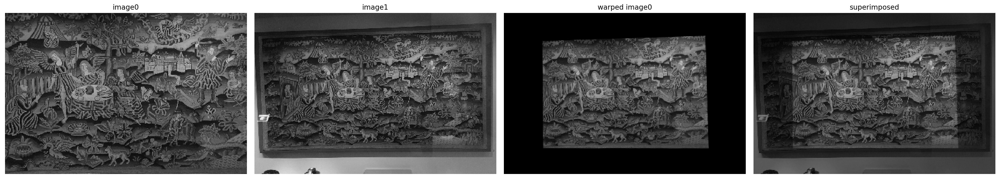

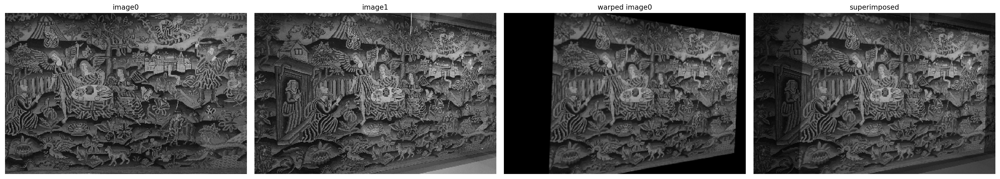

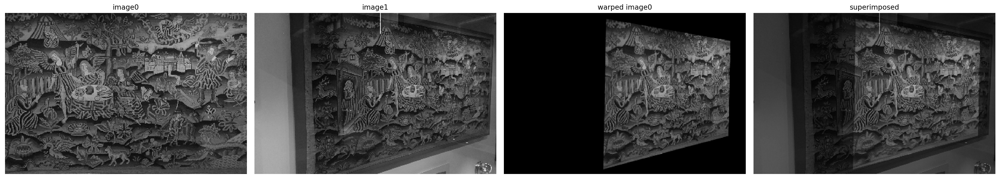

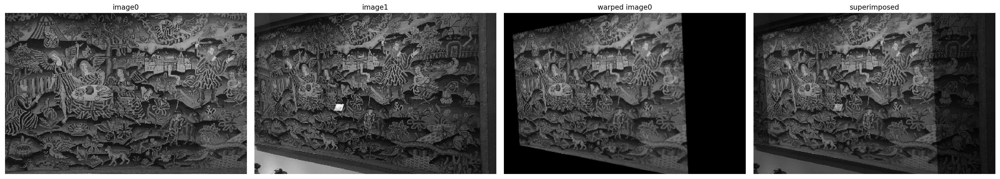

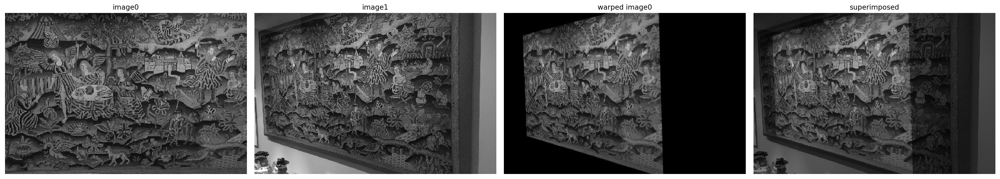

...

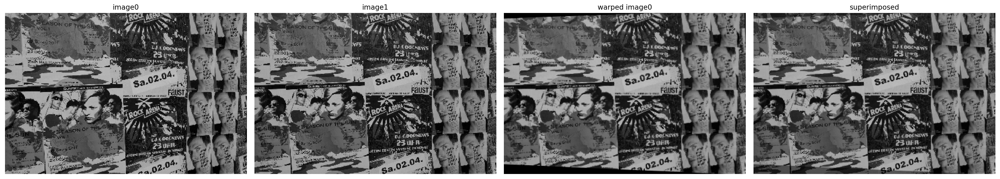

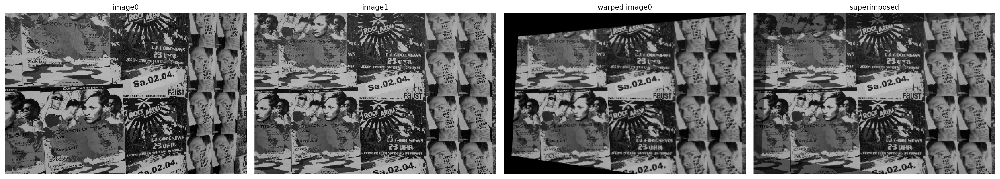

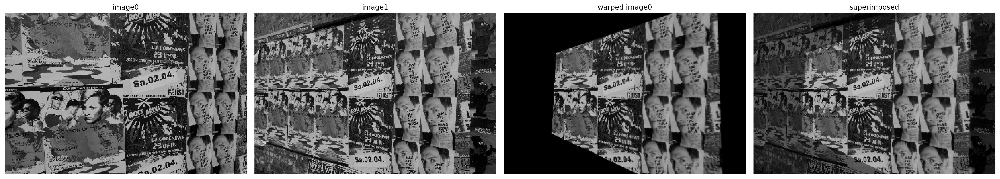

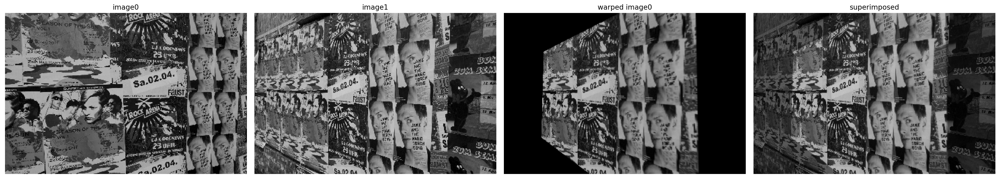

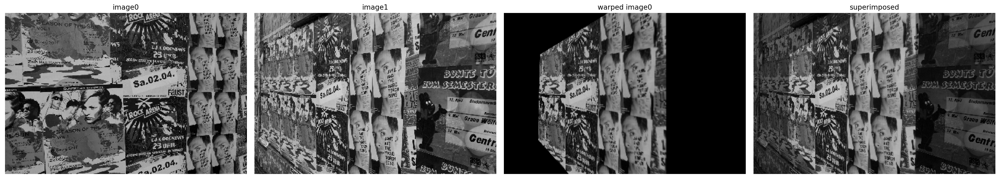

In [4]:
num_img = 20
for i in range(num_img):
    d = next(data)
    img0 = d['image'].squeeze()
    img1 = d['warped_image'].squeeze()
    H = d['homography']
    warped_img0 = cv2.warpPerspective(img0, H, (img1.shape[1], img1.shape[0]))
    superimposed = cv2.addWeighted(img1, 0.5, warped_img0, 0.5, 0.)
    plot_imgs([img0, img1, warped_img0, superimposed], titles=['image0', 'image1', 'warped image0', 'superimposed'], dpi=200, cmap='gray')